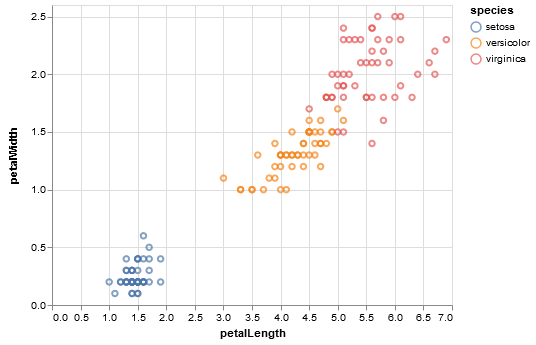

In [2]:
import os
import pandas as pd

from itkwidgets import view  ## for jupyter notebook
import numpy as np
from scipy import stats
from scipy.odr import *

import matplotlib.pyplot as plt

from pandas.plotting import parallel_coordinates
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib

from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn import manifold
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

## for AICS databasedataset
#import datasetdatabase as dsdb
## ggplot
plt.style.use('ggplot')

import altair as alt
from vega_datasets import data

iris = data.iris()

alt.Chart(iris).mark_point().encode(
    x='petalLength',
    y='petalWidth',
    color='species'
)

Constructing df from csv imports

In [3]:
import_dir = r'C:\Users\winniel\Desktop\Drug datasets export'

df = pd.read_csv(os.path.join(import_dir, 'df.csv'), header = 0)
ds_gol_fea = pd.read_csv(os.path.join(import_dir, 'ds_gol_fea.csv'), 
                         header = 0)
ds_tub_fea = pd.read_csv(os.path.join(import_dir, 'ds_tub_fea.csv'), 
                         header = 0)
ds_sec_fea = pd.read_csv(os.path.join(import_dir, 'ds_sec_fea.csv'), 
                         header = 0)
ds_dna_fea = pd.read_csv(os.path.join(import_dir, 'ds_dna_fea.csv'), 
                         header = 0)
ds_mem_fea = pd.read_csv(os.path.join(import_dir, 'ds_mem_fea.csv'), 
                         header = 0)


Functions

In [4]:
## Method to count number of entries in each structure and drug, returns table 
def GetConditionCounts(*features):
    conditions = df.groupby(list(features)).size().reset_index(name='Count')
    return conditions

## Function for scaling original data's variance. Returns scaled dataset
## Pre-processing before doing PCA
def scaleFeaturesDF(df):
    scaled = preprocessing.StandardScaler().fit_transform(df)
    scaled = pd.DataFrame(scaled, columns=df.columns)
    
    print("New Variances:\n", scaled.var())
    print("New Describe:\n", scaled.describe())
    return scaled

## return list of colors and legends for graphing
def ColorAndLegend(df, mapping):
    ## set different colors for each group
    colors = []
    legend = []
    color_selection = ['b', 'g', 'k', 'y', 'r']
    legend_selection = []
    for x in range(0, len(mapping)):
        legend_selection.append(mapping[x])
    
    ## Legend = list of drug_label names of input data
    for cat in df['drug_label']:
        colors.append(color_selection[cat])
        legend.append(legend_selection[cat])
    
    return colors, legend
 
## Calculate correlation coefficient between every column of struc_subset 
## and a column vector of PCA_T. Returns table of correlation coeffs
def GetCorrCoeff(struc_subset, PCA_T):                                          ## PCA_T is 1-D list of one of PC
    corr_coeff = []
    col_list = list(struc_subset)
    for col in col_list:    
        corr = np.corrcoef(struc_subset[col], PCA_T)[1,0]                       ## just corrcoeff returns a 2x2 matrix (diagonal 1's)
        corr_coeff.append(corr)
    return corr_coeff


## Plot 3D graphs of dimensionality reduction (PCA, LDA, Isomap)
def PlotT(T, color_selection, graphtype=None, addtotitle=None, drug_lab=None):
    dimensionality = T.shape[1]
    column_data = {f'C{i+1}': T[:, i] for i in range(dimensionality)}
    T_lab = pd.DataFrame({
            'drug_label': drug_lab,
            **column_data})                                                     ## ** for expands dictionary
            
    fig = plt.figure()
    projection = '3d' if dimensionality == 3 else None
    ax = fig.add_subplot(111, projection=projection)
    
    ax.set_title('{} of {} {}'.format(graphtype, STRUCTURE, addtotitle))
    ax.set_xlabel('Component 1')
    if dimensionality > 1:
        ax.set_ylabel('Component 2')
    if dimensionality > 2:
        ax.set_zlabel('Component 3')
    
    for drug in drug_lab.unique():
        xyz = T_lab.groupby('drug_label').get_group(drug)
        index = mapping.index(drug)
        color = color_selection[index]
        if dimensionality == 1:
            ax.hist(*[xyz[c].values for c in xyz.columns if c.startswith('C')],
                    label=drug, alpha=0.5)
            continue
        else: 
            ax.scatter(*[xyz[c].values for c in xyz.columns if c.startswith('C')], 
                       c=color, label=drug, alpha=0.75)
    
    ## Plot
    plt.legend()
    plt.show()
    
    return T_lab

## Find the correlation coefficient for all three PC's. Returns corr table
def GetCorrTable(struc_subset, T_lab, sort_by='Abs(C1)'):
    dimensionality = T_lab.shape[1] - 1
    
    C_table = {}
    C_table.update({'C1_corr': GetCorrCoeff(struc_subset, T_lab['C1'])})        ## same correlation using original scaled or unscaled
    if dimensionality > 1:
        C_table.update({'C2_corr': GetCorrCoeff(struc_subset, T_lab['C2'])})
    if dimensionality > 2:
        C_table.update({'C3_corr': GetCorrCoeff(struc_subset, T_lab['C3'])})
    
    corr_data_abs = {f'Abs(C{i+1})': [abs(x) for x in C_table[f'C{i+1}_corr']] for i in range(dimensionality)}
    corr_data = {f'C{i+1}': C_table[f'C{i+1}_corr'] for i in range(dimensionality)}
    
    corr_table = pd.DataFrame({'Feature': list(struc_subset),
                               **corr_data_abs,
                               **corr_data})    
    """
    corr_table = pd.DataFrame({'Feature': list(struc_subset),
                               'Abs(C1)': [abs(x) for x in C1_corr],
                               'Abs(C2)': [abs(y) for y in C2_corr],
                               'Abs(C3)': [abs(z) for z in C3_corr],
                               'C1': C1_corr,
                               'C2': C2_corr,
                               'C3': C3_corr})
    """
    
    corr_table_sorted = corr_table.sort_values(by = [sort_by], 
                                               ascending = False)
    return corr_table_sorted

## Evaluating changes in data variance 
## between vehicle group and with drug group. Returns table fo variances 
def CompareVar(struc_subset, drug):
    vehicle = struc_subset.groupby(by = 'drug_label').get_group('Vehicle')
    drug_gp = struc_subset.groupby(by = 'drug_label').get_group(drug)
    compare_drug = pd.concat([vehicle, drug_gp])

    veh_var = vehicle.var(axis = 0)                                             ## automatically dropped nominal columns
    comp_drug_var = compare_drug.var(axis = 0)
    ## Evaluating absolute variance changes (not scaled)
    var_comparison = pd.DataFrame({'Vehicle': veh_var,
                                   'Vehicle and {}'.format(drug): 
                                       comp_drug_var,
                                   'Difference': comp_drug_var - veh_var,
                                   'Percent Variance Change':
                                       (comp_drug_var - veh_var)/veh_var*100})

    ## drop drug label variance - irrelevant
    #var_comparison = var_comparison.drop(['drug_label'])
    
    ## sorting from higest change to lowest
    var_comparison_sorted = var_comparison.sort_values(by = 
                                                       ['Percent Variance Change'],
                                                       ascending = False)

    return var_comparison_sorted

## Plot Violin plots of different drugs
## df = data, features = list of features, # of graphs
def PlotViolin(df, features, plot_order):
    # Set up the matplotlib figure
    sns.set(style="darkgrid")
    for feature in features:
        fig = plt.figure()
        ax = fig.add_subplot(111)

        # Draw a violinplot
        ax = sns.violinplot(data=df, x="drug_label", y=feature, 
                       palette="Pastel1", order=plot_order)

## Plot Scatter plot for each category with 95% confidence interval
def PlotScatterCI(df, features, plot_order, groupby='drug_label', ttest=True,
                  addtotitle=None):
    # Set up the matplotlib figure
    
    sns.set(style="darkgrid")
    
    p_val_results = {}
    for feature in features:
        fig = plt.figure()
        ax = fig.add_subplot(111)
        ax.set_title('{}: {}{}'.format(STRUCTURE, feature, addtotitle))
        
        ax = sns.pointplot(x=groupby, y=feature, data=df, ci=95, size=3,
                           color='k', join=False, order=plot_order,
                           estimator=np.mean)
        
        ## Make sure pointplot on top                                           
        plt.setp(ax.lines, zorder=100)
        plt.setp(ax.collections, zorder=100, label="")
        
        sns.stripplot(x=groupby, y=feature, data=df, jitter=True,
                          palette="Pastel1", edgecolor='k', size=5, 
                          order=plot_order)
        
        if ttest:
        ## return T-Test stats
            p_val_table = {}
            for drug in plot_order:
                if drug != 'Vehicle':
                    vehicle = df[(df.drug_label == 'Vehicle')][feature]
                    drug_df = df[(df.drug_label == drug)][feature]                                                   
                    t_stat, p_val = stats.ttest_ind(vehicle, drug_df)
                    p_val_table.update({'{}'.format(drug): p_val})
                    
            p_val_table2 = pd.DataFrame(list(p_val_table.items()),
                                       columns = ['Drug group against Vehicle',
                                                  'p-value'])
            p_val_results.update({'{}'.format(feature): p_val_table2})
   
    if ttest:    
        return p_val_results

## 2D scatter plot: dff = dataset, plot_foi = list of features to plot
## x and y_lab are feature names on x and y axis
def PlotScatter2D(dff, plot_foi, *doi, x_lab='dna_volume', linreg=False, 
                  odrreg=False):
    
    if isinstance(doi[0], list):
        doi = doi[0]
    
        
    for foi in plot_foi:
        
        fig = plt.figure()
        ax = fig.add_subplot(111)
        y_lab = foi
    
        ax.set_title('{}: {}'.format(STRUCTURE, foi))
        ax.set_xlabel('{}'.format(x_lab))
        ax.set_ylabel('{}'.format(y_lab))
        
        for drug in doi:
            index = mapping.index(drug)
            try:
                drug_group = dff.groupby('drug_label').get_group(drug)
                color = color_selection[index]
                ax.scatter(drug_group[x_lab], drug_group[y_lab],
                           c=color, label=drug)
                x = drug_group[x_lab]
                y = drug_group[y_lab]
                    
                if linreg:
    
                    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
                    r_sq = r_value**2
                    ax.plot(x, intercept + slope*x, c='r', 
                            label='OLR R^2: {:.3f}'.format(r_sq))
                
                if odrreg:
                    ## Model for fitting
                    linear_model = Model(linear_f)
                    
                    ## Real Data Object             
                    data = RealData(x, y)
                    #data = Data(x, y)
                    ## Set up ODR with model and data
                    odr = ODR(data, linear_model, beta0=[0, 1])
                    out = odr.run()
                    out.pprint()
                    rv = out.res_var
                    ## Generate fitted data
                    x = x.sort_values()
                    x = list(x)
                    x_fit = np.linspace(x[0], x[-1], 1000)
                    y_fit = linear_f(out.beta, x_fit)

                    ax.plot(x_fit, y_fit, c='k', 
                            label='ODR RV: {:.3f}'.format(rv))

            except:
                print('Skipped plotting {}'.format(drug))
                pass
        ## Plot
        plt.legend()
        plt.show()

## 3D scatter plot: dff = dataset, plot_foi = list of features to plot
## x and y_lab are feature names on x and y axis
def PlotScatter3D(dff, plot_foi, x_lab='dna_volume', y_lab='mem_volume'):
    for foi in plot_foi:
        
        fig = plt.figure()
        ax = fig.add_subplot(111, projection = '3d')
        z_lab = foi
    
        ax.set_title('{}: {}'.format(STRUCTURE, foi))
        ax.set_xlabel('{}'.format(x_lab))
        ax.set_ylabel('{}'.format(y_lab))
        ax.set_zlabel('{}'.format(z_lab))
        
        for drug in mapping:
            index = mapping.index(drug)
            try:
                drug_group = dff.groupby('drug_label').get_group(drug)
                color = color_selection[index]
                ax.scatter(drug_group[x_lab], drug_group[y_lab], drug_group[z_lab], 
                           c=color, label=drug)
            except:
                print('Skipped plotting {}'.format(drug))
                pass
        
        ## Plot
        plt.legend()
        plt.show()    

## Function to fit data with
def linear_f(p, x):
    m, c = p
    return m*x + c

## Global Variables

In [5]:
    
STRUCTURE = 'golgi'
NOM_COLS = ['drug_label', 'cell_id', 'cell_ver', 'czi_filename', 
            'idx_in_stack', 'roi', 'str_ver', 'structure_name']

## Features of interest
STRUC_FEA_DIC = {'golgi': list(ds_gol_fea),
                 'tubulin': list(ds_tub_fea),
                 'sec61b': list(ds_sec_fea)}

DNA_FOI = list(ds_dna_fea)
DNA_FOI.remove('cell_id')

MEM_FOI = list(ds_mem_fea)
MEM_FOI.remove('cell_id')

STRUC_FOI = STRUC_FEA_DIC.get(STRUCTURE)
STRUC_FOI.remove('cell_id')

ALL_FOI = DNA_FOI + MEM_FOI + STRUC_FOI

## Which FOI list to use
FOI = ALL_FOI

## Creating Subsets, Prepping Dataframes for Plotting

In [6]:

# Make subsets, color mapping

struc_subset = df.groupby(by='structure_name').get_group(STRUCTURE)
## Save out nominal columns
nom_cols = struc_subset[NOM_COLS]

## fill struc_subset with DNA, MEM, and STR features
struc_subset = struc_subset[ALL_FOI]

## get color mapping of drug to color
## Change the drug_label column to category dtypes and change to codes
struc_subset['drug_label'] = nom_cols['drug_label']
struc_subset['drug_label'] = struc_subset['drug_label'].astype("category")
mapping = dict(enumerate(struc_subset['drug_label'].cat.categories))
mapping = list(mapping.values())
color_map = ['b', 'g', 'k', 'y', 'r', 'm', 'c']

## Add column for scene number
scene_number = []
session_number = []
for filename in nom_cols['czi_filename']:
    before, after = filename.split('-Scene-')
    scene = after.split('-')[0]
    session = before.split('_')[-1]
    scene_number.append(scene)
    session_number.append(session)
    
struc_subset['scene_number'] = scene_number
struc_subset['session_number'] = session_number
struc_subset['scene_number'] = struc_subset['scene_number'].astype('int64')
struc_subset['session_number'] = struc_subset['session_number'].astype('int64')

## assign color per drug
color_selection = [color_map[index] for index in range(len(mapping))]

In [7]:
## golgi
foi = ['str_1st_axis_length_mean',
        'str_2nd_axis_length_mean',
        'str_3rd_axis_length_mean',
        'str_equator_eccentricity_mean',
        'str_meridional_eccentricity_mean',
        'str_number_of_components',
        'str_sphericity_mean',
        'str_surface_area_mean',
        'str_volume_mean']

## Dictionary of feature grouping
d = {'DNA Features': DNA_FOI, 
     'MEM Features': MEM_FOI,
     'DNA and MEM Features': DNA_FOI + MEM_FOI,
     'Structure Features': STRUC_FOI,
     'All Features': ALL_FOI,
     'Selected Structure Features': foi}




In [8]:
## plot_order - select which drug groups to plot
plot_order = ['Vehicle']
for i in range(len(mapping)):
    if mapping[i] not in plot_order:
        plot_order.append(mapping[i])  

In [9]:
## Formatting df to run before PCA/ISOMAP/LDA

## Turn NaN values into 0's (with number of structure components = 0 and 1)
struc_subset_filled = struc_subset[ALL_FOI]
struc_subset_filled = struc_subset_filled.fillna(0, inplace=False)
#struc_subset_filled = struc_subset

## Add drug_label column - LDA will ignore this column
struc_subset_filled['drug_label'] = nom_cols['drug_label']
struc_subset_filled['session_number'] = struc_subset['session_number']
struc_subset_filled['cell_id'] = nom_cols['cell_id']
struc_subset_filled['czi_filename'] = nom_cols['czi_filename']


In [10]:
%matplotlib widget

LDA_results = {}
sortby = 'Abs(C1)'

for key, foi in d.items():
    lda_df = struc_subset_filled[foi]
    lda = LDA(n_components = 3)
    #T = lda.fit_transform(lda_df, y=nom_cols['drug_label'])
    T = lda.fit_transform(lda_df, y=struc_subset_filled['drug_label'])
    T_lab = PlotT(T, color_selection, graphtype='LDA',
                  addtotitle = ': {}'.format(key), 
                  drug_lab = struc_subset_filled['drug_label'])
    Corr_Table = GetCorrTable(struc_subset_filled[foi], T_lab, sort_by = sortby)
    exp_var_ratio = lda.explained_variance_ratio_
    LDA_results.update({'{}'.format(key): {'T_lab': T_lab,
                                            'exp_var_ratio': exp_var_ratio,
                                            'Corr_Table': Corr_Table}})

Variables are collinear.


FigureCanvasNbAgg()

invalid value encountered in true_divide
invalid value encountered in true_divide
Variables are collinear.


FigureCanvasNbAgg()

invalid value encountered in true_divide
invalid value encountered in true_divide
Variables are collinear.


FigureCanvasNbAgg()

invalid value encountered in true_divide
invalid value encountered in true_divide
Variables are collinear.


FigureCanvasNbAgg()

invalid value encountered in true_divide
invalid value encountered in true_divide
Variables are collinear.


FigureCanvasNbAgg()

invalid value encountered in true_divide
invalid value encountered in true_divide


FigureCanvasNbAgg()

# Altair Interactive Plots

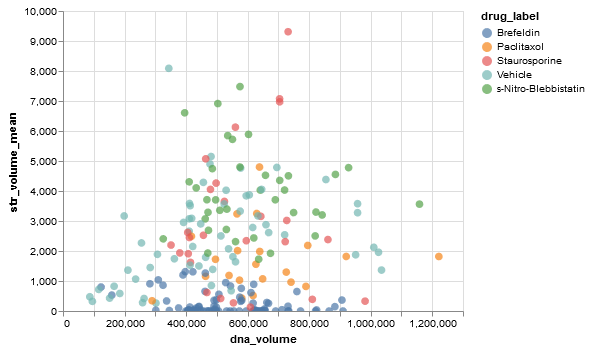

In [11]:
import altair as alt

# data with DNA, MEM, and STRUCTURE features + 'drug_label' + 'session_number'
data = struc_subset_filled

alt.Chart(data).mark_circle(size=60).encode(
    x='dna_volume',
    y='str_volume_mean',
    color='drug_label',
    tooltip=['cell_id', 'czi_filename', 'session_number']
).interactive()

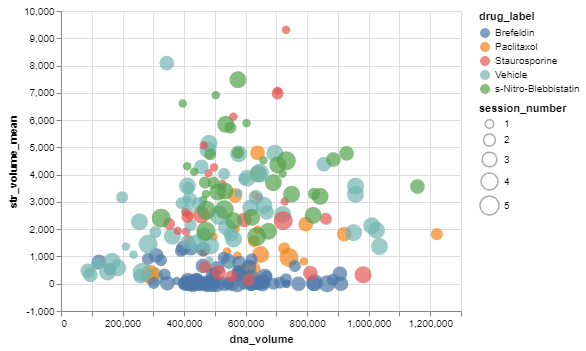

In [48]:
# data with DNA, MEM, and STRUCTURE features + 'drug_label' + 'session_number'
data = struc_subset_filled

alt.Chart(data).mark_circle().encode(
    alt.X('dna_volume', scale=alt.Scale(zero=False)),
    alt.Y('str_volume_mean', scale=alt.Scale(zero=False, padding=1)),
    color='drug_label',
    tooltip=['cell_id', 'czi_filename', 'session_number'],
    size='session_number'
).interactive()

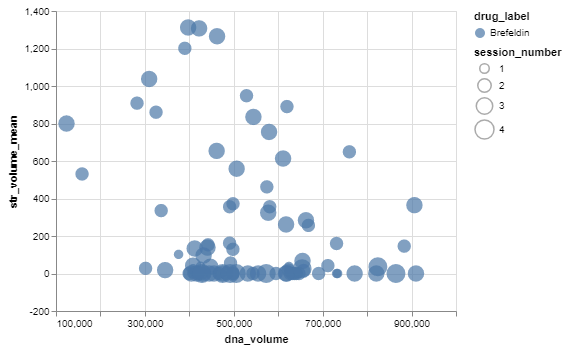

In [57]:
# data with DNA, MEM, and STRUCTURE features + 'drug_label' + 'session_number'
data = struc_subset_filled
data = struc_subset_filled.groupby('drug_label').get_group('Brefeldin')

alt.Chart(data).mark_circle().encode(
    alt.X('dna_volume', scale=alt.Scale(zero=False)),
    alt.Y('str_volume_mean', scale=alt.Scale(zero=False, padding=1)),
    color='drug_label',
    tooltip=['cell_id', 'czi_filename', 'session_number'],
    size='session_number'
).interactive()

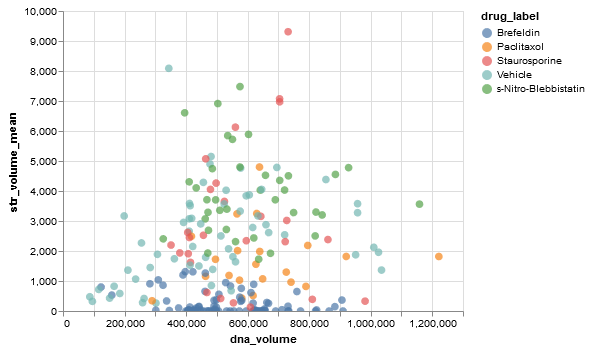

In [12]:
# data with DNA, MEM, and STRUCTURE features + 'drug_label' + 'session_number'
data = struc_subset_filled

alt.Chart(data).mark_circle(size=60).encode(
    x='dna_volume',
    y='str_volume_mean',
    color='drug_label',
    tooltip=['cell_id', 'czi_filename', 'session_number']
).interactive()

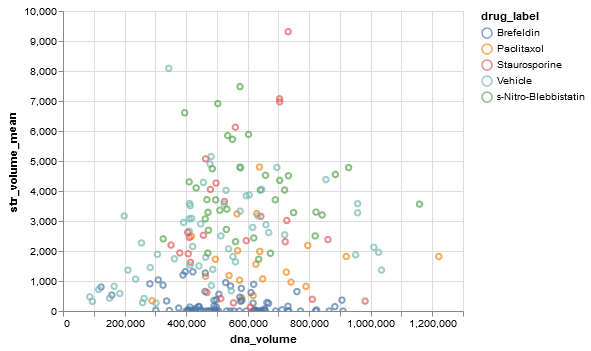

In [13]:
# data with DNA, MEM, and STRUCTURE features + 'drug_label' + 'session_number'
data = struc_subset_filled

alt.Chart(data).transform_calculate(
    #url='//allen/aics/assay-dev/Analysis/QCB_DRUG_database/cell_info/' + alt.datum.cell_id
    url='file://///allen/aics/assay-dev/Analysis/QCB_DRUG_database/cell_info/' + alt.datum.cell_id 
).mark_point().encode(
    x='dna_volume:Q',
    y='str_volume_mean:Q',
    color='drug_label:N',
    href='url:N',
    tooltip=['cell_id:N', 'czi_filename:N', 'session_number:O']
).interactive()

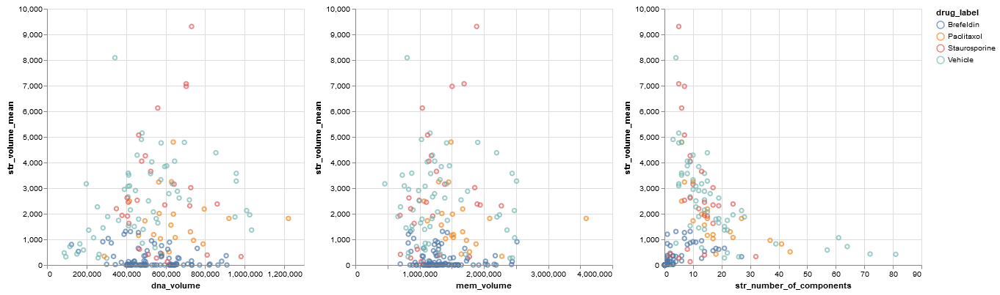

In [30]:
## data with DNA, MEM, and STRUCTURE features + 'drug_label' + 'session_number'
data = struc_subset_filled

## Remove SNB
data.drop(data[(data.drug_label == 's-Nitro-Blebbistatin')].index,
                              inplace=True)

"""
## looking at 1 drug only:
only_drug = 'Brefeldin'
data = struc_subset_filled
data = data[(data.drug_label == only_drug)]
"""

## selection types has interval, single, and multi
#brush = alt.selection(type='interval', resolve='global')
brush = alt.selection(type='multi', encodings=['x'])

base = alt.Chart(data).mark_point().encode(
    y='str_volume_mean',
    color=alt.condition(brush, 'drug_label', alt.ColorValue('gray')),
    tooltip=['cell_id:N', 'czi_filename:N', 'session_number:O']
).add_selection(
    brush
).properties(
    width=350,
    height=350
)

base.encode(x='dna_volume') | base.encode(x='mem_volume') | base.encode(x='str_number_of_components')


'https://vega.github.io/vega-datasets/data/cars.json'